In [1]:
!pip -q install segmentation-models-pytorch

In [2]:
import torch
import torch.nn as nn
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
import segmentation_models_pytorch as smp
from tqdm.notebook import tqdm

from torch.optim import *
from torch.utils.data import DataLoader, Dataset, sampler
from torchvision import datasets, transforms
import torchmetrics

import pytorch_lightning as pl

from PIL import Image
from glob import glob
import sys
import os
import skimage
import random
import gc

import wandb
import warnings
warnings.filterwarnings("ignore")

In [3]:
os.chdir("/kaggle/working")

In [4]:
class DiceLoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(DiceLoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        intersection = (inputs * targets).sum()                            
        dice = (2.*intersection + smooth)/(inputs.sum() + targets.sum() + smooth)  
        return 1 - dice

In [5]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

In [6]:
class LiTSDataset(Dataset):
    def __init__(self, image_dir, mask_dir, transform=None):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.transform = transform
        self.images = os.listdir(image_dir)
        
    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_name = os.path.join(self.image_dir, self.images[idx])
        mask_name = img_name.replace("images", "masks")
        image = Image.open(img_name).resize((224, 224))
        mask = Image.open(mask_name).resize((224, 224))
        
        image = np.asarray(image)
        mask = np.asarray(mask)
        
        image = image / 255.
        image = np.expand_dims(image, axis=0)
        
        mask = (mask > 0).astype(np.uint8)
        mask = np.expand_dims(mask, axis=0)
            
        return torch.Tensor(image), torch.Tensor(mask).long()

In [7]:
dataset = LiTSDataset("/kaggle/input/litsdataset2/images", "/kaggle/input/litsdataset2/masks")

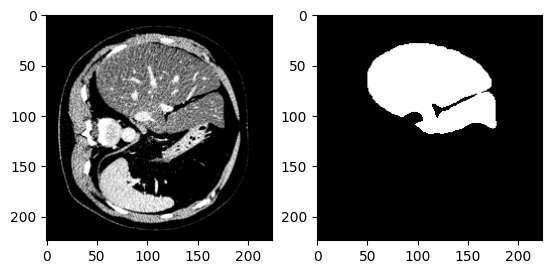

In [8]:
el, mask = random.choice(dataset)
plt.subplot(121)
plt.imshow(el[0], cmap='gray')

plt.subplot(122)
plt.imshow(mask[0], cmap='gray')

In [9]:
train_size = int(0.8 * len(dataset))
val_size = int(0.1 * len(dataset))
test_size = len(dataset) - train_size - val_size
batch_size = 32

train_dataset, test_dataset, val_dataset = torch.utils.data.random_split(dataset, [train_size, test_size, val_size])

In [10]:
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

In [55]:
class LitsModel(pl.LightningModule):
    def __init__(self):
        super().__init__()
        
        self.model = smp.UnetPlusPlus(
            encoder_name='efficientnet-b5',
            encoder_weights=None,
            in_channels=1,
            activation='sigmoid'
        )
        
        self.criterion = DiceLoss()
        
    def forward(self, x):
        return self.model(x)
        
    def training_step(self, batch):
        inputs, truth = batch
        outputs = self(inputs)
        
        loss = self.criterion(outputs, truth)
        self.log('loss/train', loss.item(), prog_bar=True)
        self.log('epoch/loss/train', loss.item(), prog_bar=True, on_epoch=True)
        
        return loss
    
    def test_step(self, batch):
        inputs, truth = batch
        outputs = self(inputs)
        
        loss = self.criterion(outputs, truth)
        self.log('loss/test', loss.item())
        self.log('dice', 1. - loss.item())
    
    def validation_step(self, batch):
        inputs, truth = batch
        outputs = self(inputs)
        
        loss = self.criterion(outputs, truth)
        self.log('loss/val', loss.item(), prog_bar=True)
        self.log('epoch/loss/val', loss.item(), prog_bar=True, on_epoch=True)
        
    def configure_optimizers(self):
        return RMSprop(self.parameters(), lr=1e-4)
    
    def prediction_step(self, batch, batch_idx, dataloader_idx=0):
        inputs, _ = batch
        return self(inputs)

In [56]:
gc.collect()
torch.cuda.empty_cache()

# model = LitsModel()

In [57]:
# trainer = pl.Trainer(
#     max_epochs=5,
#     max_time={'hours': 3},
# #     limit_train_batches=250,
# #     limit_val_batches=1,
# #     limit_test_batches=1,
# )

In [58]:
# print("starting training ...")
# trainer.fit(model, train_loader, val_loader)

In [59]:
model = LitsModel.load_from_checkpoint("/kaggle/input/litstrained/lightning_logs/version_0/checkpoints/epoch=4-step=7330.ckpt")

In [60]:
trainer = pl.Trainer()

In [62]:
trainer.test(model, test_loader)

Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│           dice            │    0.9704660177230835     │
│         loss/test         │   0.029534131288528442    │
└───────────────────────────┴───────────────────────────┘

[{'loss/test': 0.029534131288528442, 'dice': 0.9704660177230835}]

In [65]:
inputs = []
predictions = []
truths = []

device = 'cuda'
model = model.to(device)

with torch.no_grad():
    for input, truth in tqdm(test_loader):
        input, truth = input.to(device), truth.to(device)
        pred = model(input)
        
        inputs.append(input)
        predictions.append(pred)
        truths.append(truth)

  0%|          | 0/184 [00:00<?, ?it/s]

In [72]:
inputs2 = torch.cat(inputs).cpu().numpy().squeeze()
predictions2 = torch.cat(predictions).cpu().numpy().squeeze()
truths2 = torch.cat(truths).cpu().numpy().squeeze()

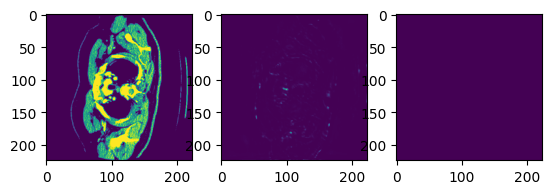

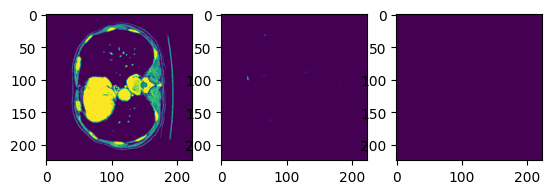

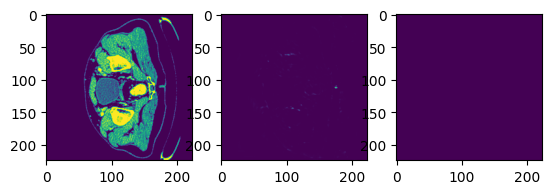

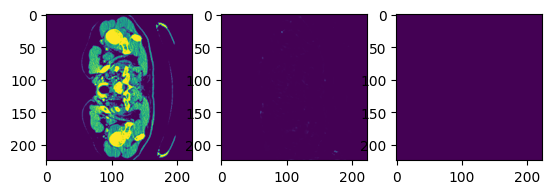

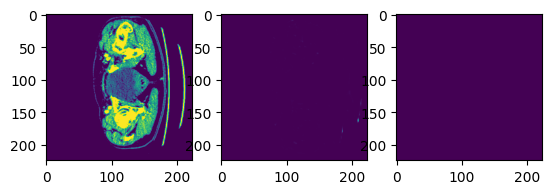

...

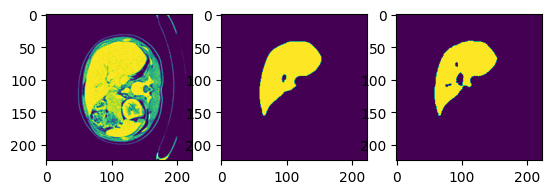

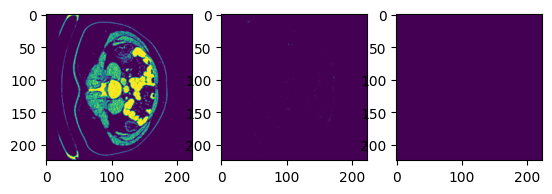

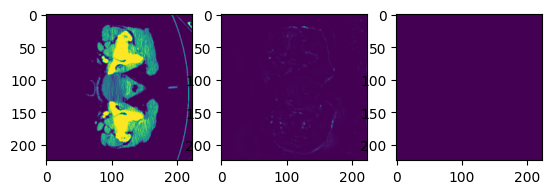

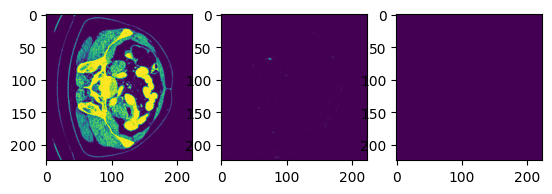

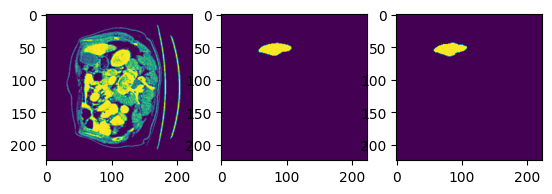

Exception ignored in: <function _xla_gc_callback at 0x7bb448d28160>
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/jax/_src/lib/__init__.py", line 97, in _xla_gc_callback
    def _xla_gc_callback(*args):
KeyboardInterrupt: 


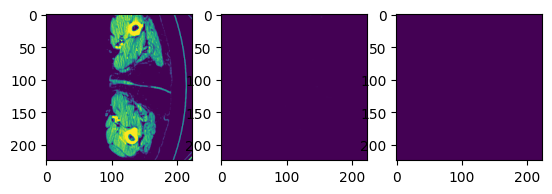

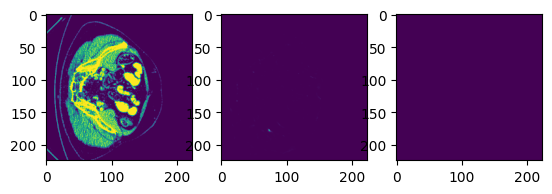

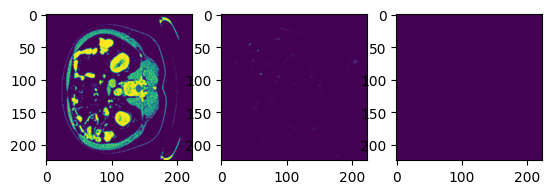

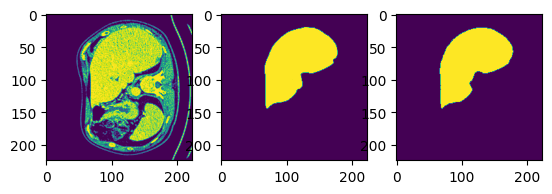

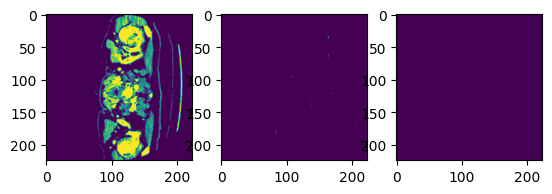

...

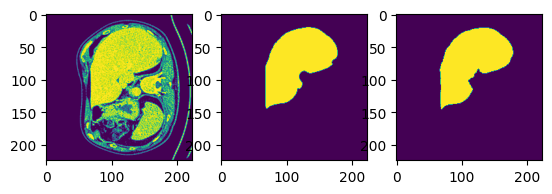

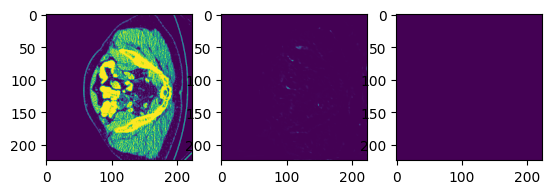

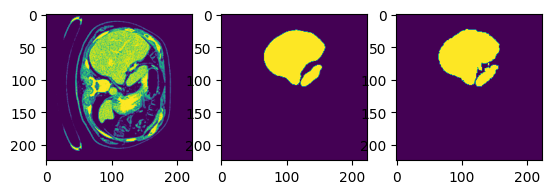

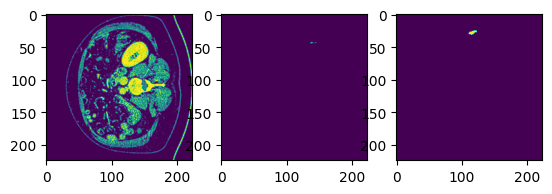

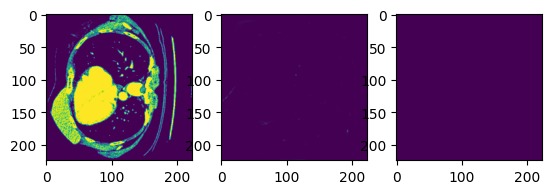

In [ ]:
for i, t, p in zip(inputs2, predictions2, truths2):
    plt.subplot(1,3,1)
    plt.imshow(i)
    
    plt.subplot(1,3,2)
    plt.imshow(t)
    
    plt.subplot(1,3,3)
    plt.imshow(p)
    plt.show()